In [3]:
import findspark
findspark.init()

import yaml
import numpy as np
from ultralytics import YOLOv10
import cv2
from pyspark.sql import SparkSession
from pyspark.sql.functions import udf, col
from pyspark.sql.types import BinaryType
import supervision as sv


def load_kafka_config(config_path):
    with open(config_path, 'r') as file:
        kafka_config = yaml.safe_load(file)
    return kafka_config

#Create spark session
spark = SparkSession.builder \
    .appName("TrafficViolationDetection") \
    .config("spark.jars.packages", "org.apache.spark:spark-sql-kafka-0-10_2.12:3.5.1")\
    .getOrCreate()



#model = torch.hub.load('F:\\BigData\\Traffic_Violation_Detection\\data\\models\\best.pt', model='yolov10')
model_path = 'F:\\BigData\\Traffic_Violation_Detection\\data\\models\\best.pt'
model = YOLOv10(model_path)

# Define annotators
bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()


f:\BigData\Traffic_Violation_Detection\myenv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [17]:


def process_frame_udf(frame_bytes):
    frame = np.frombuffer(frame_bytes, dtype=np.uint8)
    frame = cv2.imdecode(frame, cv2.IMREAD_COLOR)
    if frame is None:
        return []
    
    results = model(frame)[0]
    detections = sv.Detections.from_ultralytics(results)
    is_green = False

    # If there is class 3, don't annotate class 0
    if 3 in detections.class_id:
        is_green = True

    if is_green:
        # Dont annotate class 0
        detections = sv.Detections(class_id=[3], bbox=detections.bbox)
        
    violation_detections = [class_id for class_id in detections.class_id if class_id == 0 or class_id == 6]

    annotated_frame = bounding_box_annotator.annotate(scene=frame, detections=detections)
    annotated_frame = label_annotator.annotate(annotated_frame, detections)

    # Encode annotated frame as JPEG
    _, buffer = cv2.imencode('.jpg', annotated_frame)
    frame_bytes = buffer.tobytes()

    # Add a flag to indicate if violation is detected
    # if violation_detections:
    #     frame_bytes += b'|violation'
    frame = np.frombuffer(frame_bytes, dtype=np.uint8)
    frame = cv2.imdecode(frame, cv2.IMREAD_COLOR)
        #print("No violation")

    #resize 640 640
    frame = cv2.resize(frame,(640,640))
    cv2.imshow('frame', frame)
    cv2.waitKey(1)
    
            
    return frame_bytes

In [18]:
video = "F:\\BigData\\videos_input\\IMG_1320.MOV"
#send frame and predict
cap = cv2.VideoCapture(video)
while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_bytes = cv2.imencode('.jpg', frame)[1].tobytes()
    process_frame_udf(frame_bytes)



0: 384x640 1 green, 1 helmet, 2 motorbikes, 214.0ms
Speed: 6.0ms preprocess, 214.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


AttributeError: 'Detections' object has no attribute 'bbox'

In [2]:
import os
import cv2
from ultralytics import YOLOv10
import supervision as sv

In [20]:
if (3 in [8,7,1]) or (7 not in [8,7,1]) or (8 not in [8,7,1]):
    print(True)

#### Show CLASS_NAME and their ID

In [3]:

model = YOLOv10('F:\\BigData\\Traffic_Violation_Detection\\data\\models\\best.pt') # yolov3-v7
model.names

{0: 'btrl',
 1: 'bus',
 2: 'car',
 3: 'green',
 4: 'helmet',
 5: 'motorbike',
 6: 'no_helmet',
 7: 'red',
 8: 'yellow'}

## TEST MODEL WITH FRAME

In [2]:

# Initialize model
model_path = 'F:\\BigData\\Traffic_Violation_Detection\\data\\models\\best.pt'
model = YOLOv10(model_path)

# Path to the folder containing images
image_folder_path = 'F:\\BigData\\Traffic_Violation_Detection\\data\\tmp'

# Define annotators
bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()





0: 384x640 4 helmets, 3 motorbikes, 1 red, 335.7ms
Speed: 15.0ms preprocess, 335.7ms inference, 15.0ms postprocess per image at shape (1, 3, 384, 640)
[7 5 5 4 5 4 4 4]


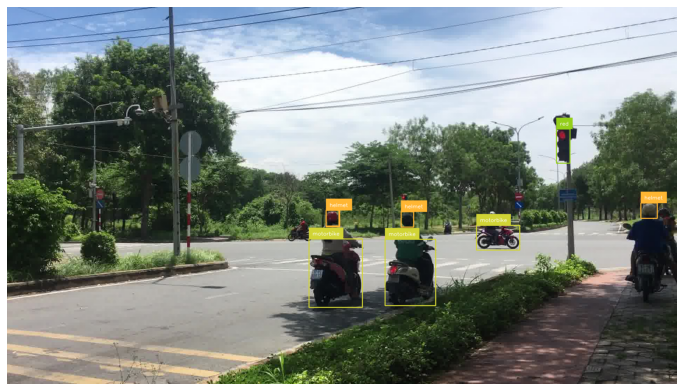


0: 288x640 1 helmet, 1 yellow, 221.2ms
Speed: 3.0ms preprocess, 221.2ms inference, 2.0ms postprocess per image at shape (1, 3, 288, 640)
[8 4]


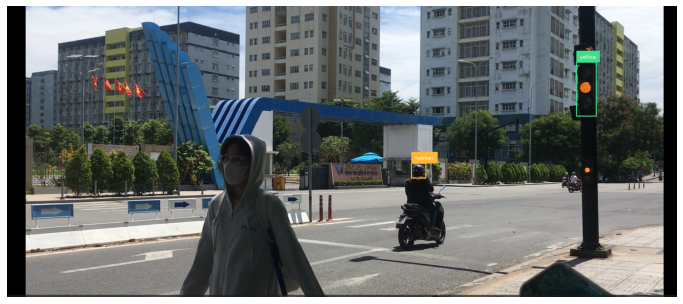


0: 288x640 2 helmets, 1 motorbike, 1 red, 165.6ms
Speed: 3.0ms preprocess, 165.6ms inference, 2.0ms postprocess per image at shape (1, 3, 288, 640)
[5 7 4 4]


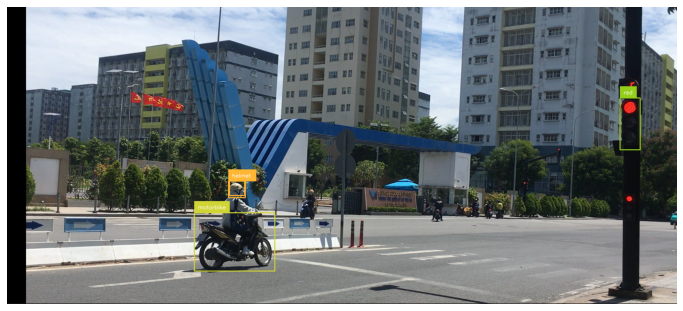


0: 320x640 2 greens, 9 helmets, 3 motorbikes, 330.3ms
Speed: 3.0ms preprocess, 330.3ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 640)
[3 4 4 4 5 4 4 4 3 4 5 5 4 4]


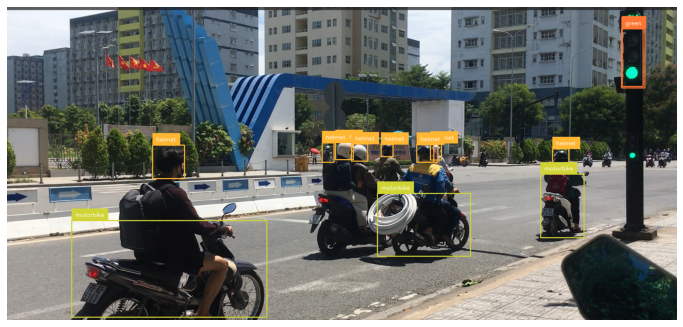


0: 640x640 6 btrls, 7 helmets, 1 motorbike, 1 no_helmet, 382.3ms
Speed: 7.4ms preprocess, 382.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
[0 4 0 0 5 0 4 4 4 4 4 0 0 4 6]


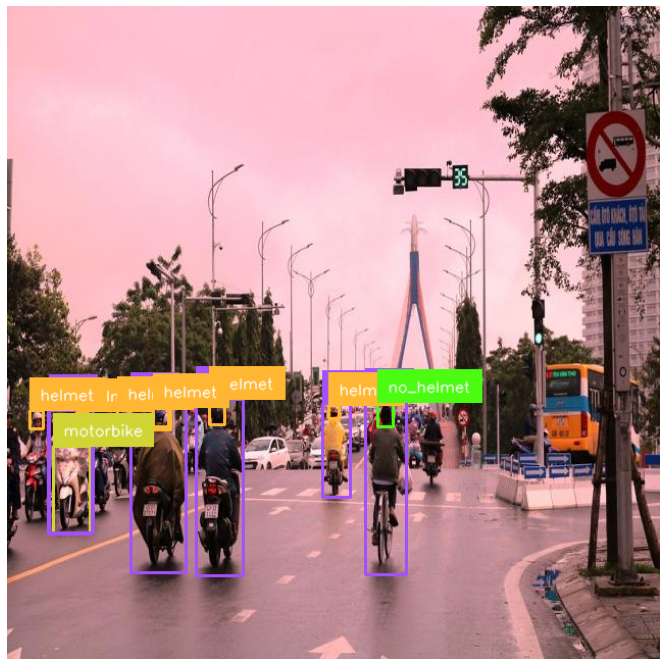


0: 640x640 2 helmets, 1 motorbike, 428.6ms
Speed: 6.0ms preprocess, 428.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
[5 4 4]


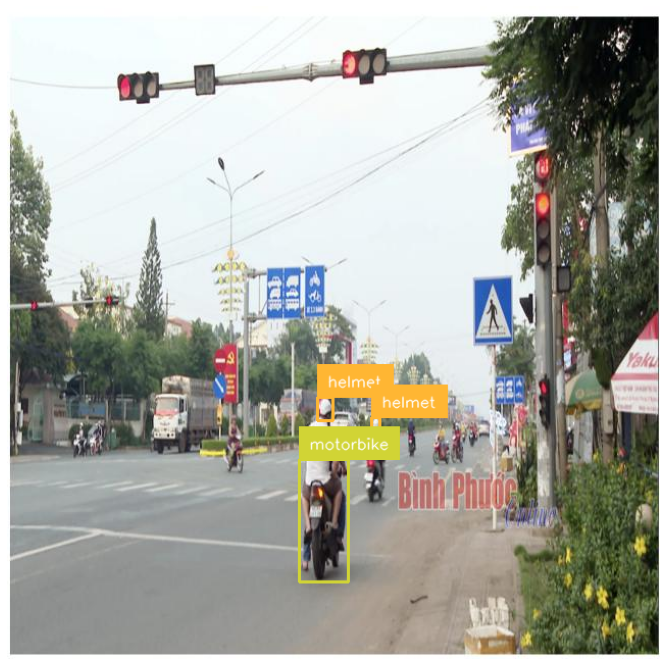


0: 640x640 2 helmets, 2 motorbikes, 329.2ms
Speed: 5.0ms preprocess, 329.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
[5 5 4 4]


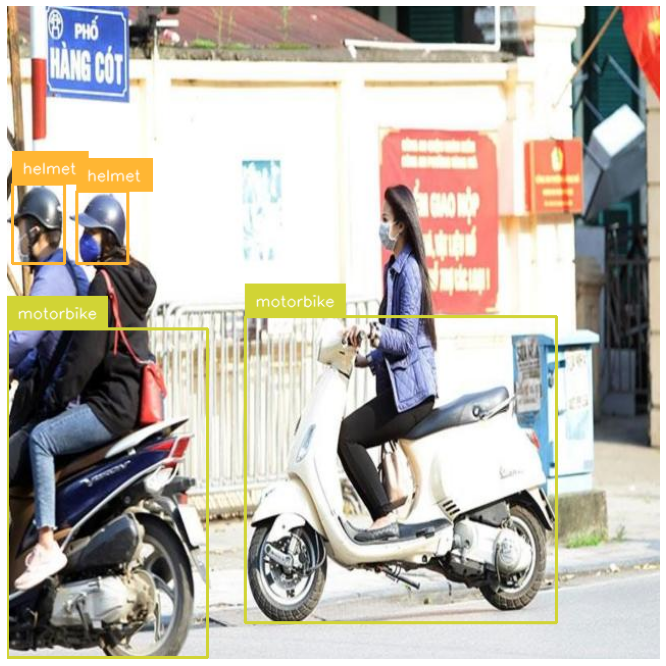


0: 640x640 1 helmet, 3 motorbikes, 3 no_helmets, 459.8ms
Speed: 6.0ms preprocess, 459.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
[5 5 6 5 4 6 6]


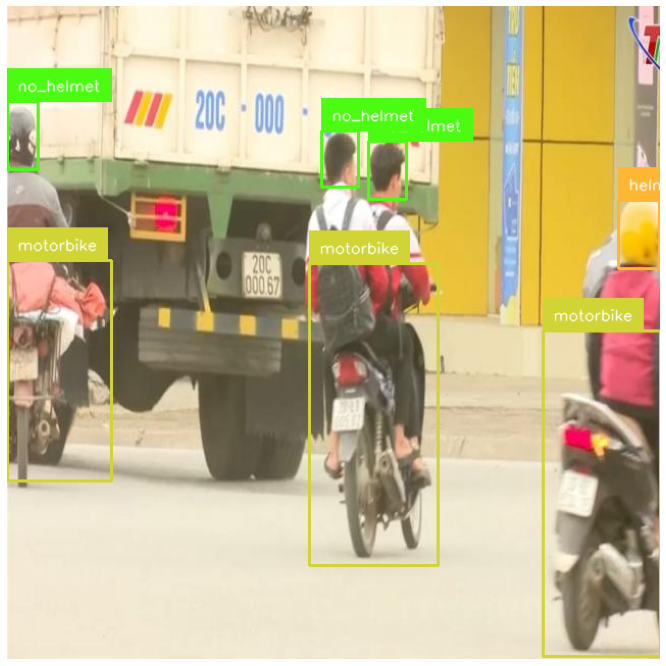


0: 640x640 2 motorbikes, 1 no_helmet, 339.2ms
Speed: 6.0ms preprocess, 339.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
[5 5 6]


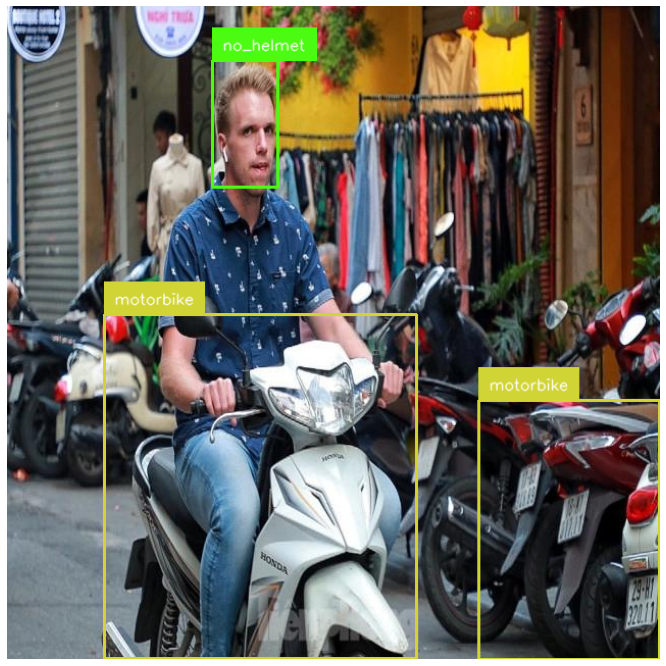


0: 640x640 1 car, 3 motorbikes, 4 no_helmets, 466.5ms
Speed: 5.1ms preprocess, 466.5ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
[5 2 6 5 6 6 5 6]


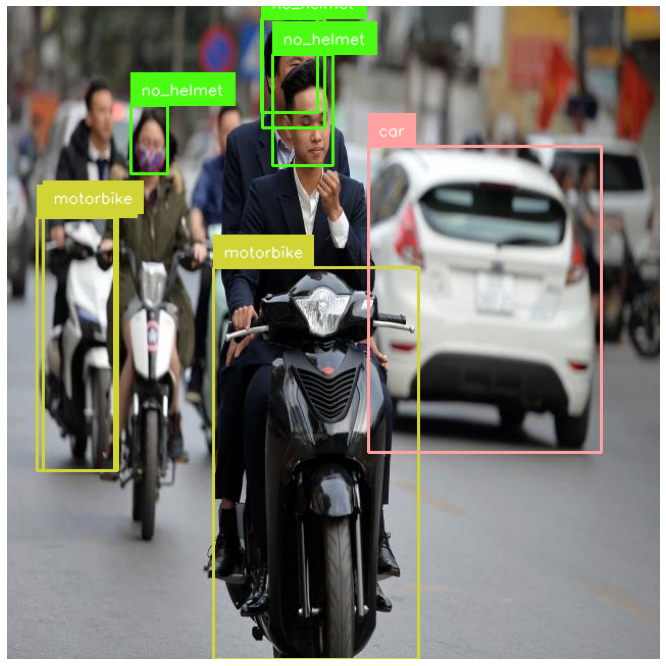


0: 640x640 1 motorbike, 3 no_helmets, 314.7ms
Speed: 6.0ms preprocess, 314.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
[6 5 6 6]


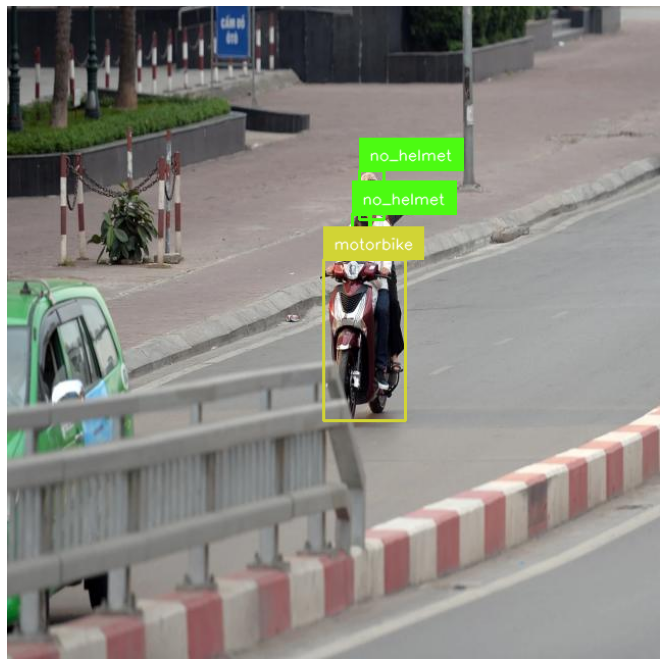


0: 640x640 2 motorbikes, 2 no_helmets, 481.3ms
Speed: 5.0ms preprocess, 481.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[5 6 5 6]


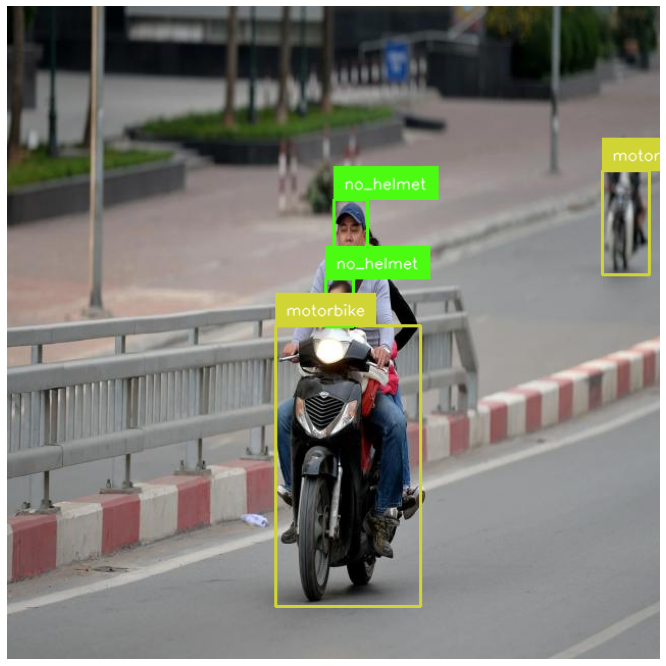


0: 640x640 2 motorbikes, 1 no_helmet, 328.6ms
Speed: 5.0ms preprocess, 328.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
[5 6 5]


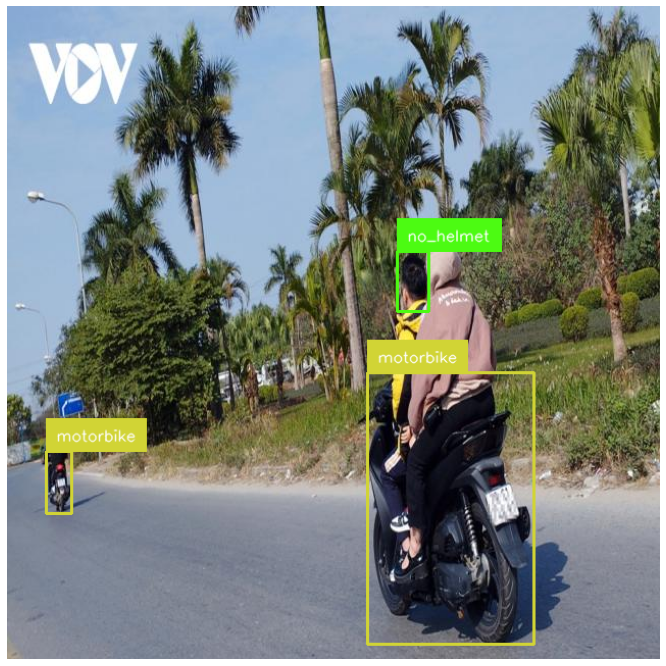

In [3]:
# Process each image in the folder
for filename in os.listdir(image_folder_path):
    if filename.endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(image_folder_path, filename)
        image = cv2.imread(image_path)

        results = model(image)[0]
        detections = sv.Detections.from_ultralytics(results)

        annotated_image = bounding_box_annotator.annotate(scene=image, detections=detections)
        annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)
        #print class_id
        print(detections.class_id)
        sv.plot_image(annotated_image)

In [1]:
import cv2
import base64
from pymongo import MongoClient
import matplotlib.pyplot as plt
import numpy as np
client = MongoClient('localhost', 27017)
db = client['traffic_violation']
collection = db['violations']


## Show IMG FROM MONGO

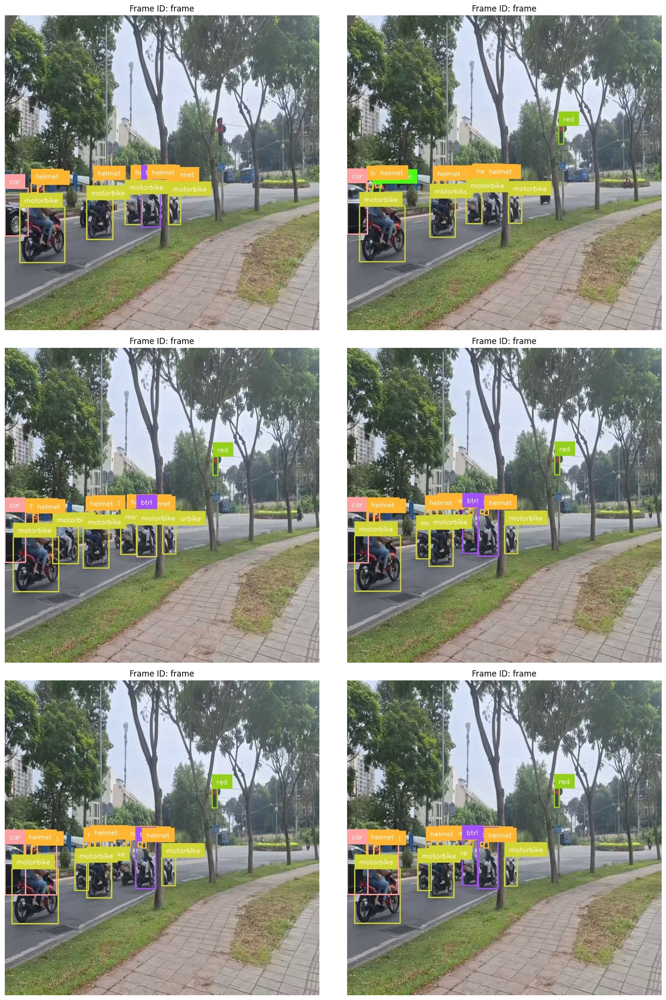

In [3]:


def plot_all_images_from_mongodb(number_of_images=6):
    # collection "violations"
    cursor = collection.find().limit(number_of_images)
    
    # count rows
    num_rows = (number_of_images + 1) // 2
    
    # subplot network
    fig, axes = plt.subplots(num_rows, 2, figsize=(15, num_rows * 7))
    
    for i, document in enumerate(cursor):
        frame_id = document['frame_id']
        frame_base64 = document['frame']
        
        # decode base64
        frame_bytes = base64.b64decode(frame_base64)
        
        # bytes to numpy array
        np_arr = np.frombuffer(frame_bytes, np.uint8)
        frame = cv2.imdecode(np_arr, cv2.IMREAD_COLOR)
        
        # BGR to RGB
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # show img
        row, col = divmod(i, 2)
        axes[row, col].imshow(frame)
        axes[row, col].set_title(f'Frame ID: {frame_id}')
        axes[row, col].axis('off')
    
    # 
    for j in range(i + 1, num_rows * 2):
        row, col = divmod(j, 2)
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

plot_all_images_from_mongodb()
